# **Implementación de los modelos**

Para evaluar el desempeño de los modelos de segmentación semántica, se implementaron y entrenaron tres arquitecturas diferentes: U-Net, U-Net con atención (Attention U-Net) y FCN-8s. Cada modelo fue entrenado durante múltiples épocas sobre un conjunto de 200 imágenes con máscaras codificadas por color, donde se consideraron tres clases más el fondo.

Durante el entrenamiento, se utilizó la métrica OneHotIoU (Intersection over Union) como referencia principal para evaluar la calidad de la segmentación, así como la pérdida categórica ponderada para compensar el desbalance de clases.

In [11]:
import tensorflow as tf
print("GPUs disponibles:", tf.config.list_physical_devices('GPU'))

GPUs disponibles: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [12]:
devices = tf.config.list_physical_devices()
print("Available devices:")
for device in devices:
    print(device)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("TensorFlow is using GPU.")
    for gpu in gpus:
        gpu_details = tf.config.experimental.get_device_details(gpu)
        print(f"GPU details: {gpu_details}")
else:
    print("TensorFlow is not using GPU.")

Available devices:
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
TensorFlow is using GPU.
GPU details: {'device_name': 'NVIDIA GeForce RTX 3050 Laptop GPU', 'compute_capability': (8, 6)}


## Librerias e importaciones

In [11]:
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img
from tensorflow.keras.models import Model
from keras.layers import Conv2D, Dense, BatchNormalization, Activation, Dropout, MaxPool2D, Flatten
from tensorflow.keras.layers import Input, MaxPooling2D, UpSampling2D
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import plot_model, to_categorical
from sklearn.metrics import roc_auc_score, jaccard_score, precision_score, recall_score, balanced_accuracy_score
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.applications import ResNet50
from keras.callbacks import ModelCheckpoint,EarlyStopping
from sklearn.model_selection import train_test_split
import datetime
from keras import regularizers
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2

## U-NET

El modelo U-Net logró una segmentación visualmente coherente con las máscaras reales, identificando correctamente las regiones correspondientes a las tres clases. A pesar de su simplicidad arquitectónica, ofreció resultados robustos en la mayoría de los casos evaluados, aunque algunas máscaras presentaban confusiones entre clases adyacentes.

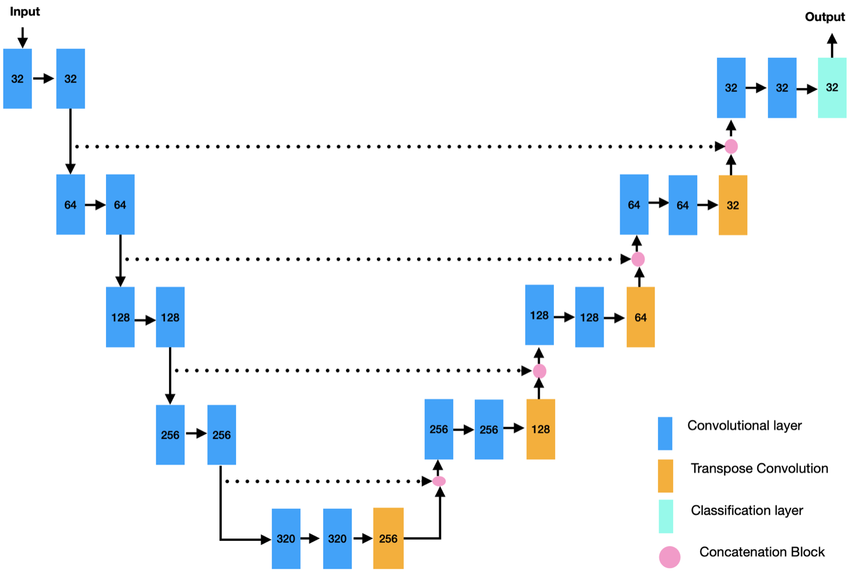

In [24]:
from IPython.display import Image, display

# Ruta a la imagen
display(Image(filename="C:/Users/EMANUEL/Downloads/Unet.png"))

Total imágenes cargadas: 100
Pesos de clase: [3.0517578e-13 6.1035156e-13 1.0000000e+00]
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_62 (Conv2D)             (None, 128, 128, 24  672         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_59 (BatchN  (None, 128, 128, 24  96         ['conv2d_62[0][0]']              
 or

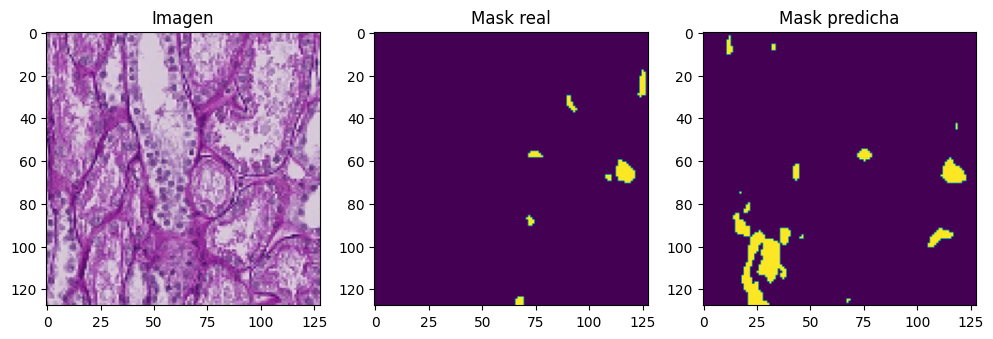

In [5]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers, models
from keras.layers import SpatialDropout2D
from sklearn.model_selection import train_test_split
from keras.metrics import OneHotIoU

# ==== CONFIGURACION ====
IMG_SIZE = (128, 128)
NUM_CLASSES = 3  # fondo + 3 clases
NUM_IMAGES = 100


data_path1 = r"C:/Users/EMANUEL/Documents/"
data_path2 = r"C:/Users/EMANUEL/Documents/"
IMAGE_DIR = os.path.join(data_path1, 'train_filter')
MASK_DIR = os.path.join(data_path2, 'mascaras_guardadas')
  
  # ==== FUNCIONES ====
def fill_mask(mask):
    COLOR_MAPPING = {
        0: (1, 0, 0),
        1: (0, 1, 0),
        2: (0, 0, 1),
        3: (1, 0, 0)
    }
    color_mask = np.zeros(IMG_SIZE + (NUM_CLASSES,), dtype=np.uint8)
    for value, color in COLOR_MAPPING.items():
        color_mask[mask[:,:] == value] = color
    return color_mask

def load_image_mask_pair(name):
    img_path = os.path.join(IMAGE_DIR, f"{name}.tif")
    mask_path = os.path.join(MASK_DIR, f"{name}_mascara.tif")

    if not os.path.exists(img_path) or not os.path.exists(mask_path):
        raise FileNotFoundError(f"No se encontró la imagen o máscara: {name}")

    # Cargar la imagen completa
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, IMG_SIZE)

    # Cargar la máscara completa
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST)

    mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
    mask_class[np.all(mask == [0, 0, 0], axis=-1)] = 0
    mask_class[np.all(mask == [255, 0, 0], axis=-1)] = 1
    mask_class[np.all(mask == [0, 255, 0], axis=-1)] = 2
    mask_class[np.all(mask == [0, 0, 255], axis=-1)] = 3
    mask_class = fill_mask(mask_class)
    return image / 255.0, mask_class

def get_dataset():
    names = sorted([f.split('.')[0] for f in os.listdir(IMAGE_DIR) if f.endswith('.tif')])[:NUM_IMAGES]
    X, y = [], []
    for name in names:
        try:
            img, mask = load_image_mask_pair(name)
            X.append(img)
            y.append(mask)
        except Exception as e:
            print(f"Saltando {name}: {e}")
        if len(X) >= NUM_IMAGES:
            break
    print(f"Total imágenes cargadas: {len(X)}")
    return np.array(X), np.array(y)

def calcular_pesos_de_clase(y_masks, num_classes=4):
    counts = np.zeros(num_classes)
    for mask in y_masks:
        for i in range(num_classes):
            counts[i] += np.sum(mask == i)
    total = np.sum(counts)
    pesos = total / (counts + 1e-6)
    pesos /= np.sum(pesos)
    return pesos.astype(np.float32)

def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)
    def loss(y_true, y_pred):
        y_pred = tf.cast(y_pred, tf.float32)
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        loss = y_true * tf.math.log(y_pred) * weights
        return -tf.reduce_sum(loss, axis=-1)
    return loss

def build_unet(input_shape, num_classes):
    inputs = layers.Input(input_shape)

    def conv_block(x, filters):
        x = layers.Conv2D(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)

        x = SpatialDropout2D(0.2)(x)

        x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        return x

    def encoder_block(x, filters):
        f = conv_block(x, filters)
        p = layers.MaxPooling2D((2, 2))(f)
        return f, p

    def decoder_block(x, skip, filters):
        x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding='same')(x)
        x = layers.Concatenate()([x, skip])
        x = conv_block(x, filters)
        return x
    
    i=24
    f1, p1 = encoder_block(inputs, i)
    f2, p2 = encoder_block(p1, i*2)
    f3, p3 = encoder_block(p2, i*4)
    f4, p4 = encoder_block(p3, i*8)
    f5, p5 = encoder_block(p4, i*16)

    b = conv_block(p5, i*16)
    
    d5 = decoder_block(b, f5, i*16)
    d4 = decoder_block(d5, f4, i*8)
    d3 = decoder_block(d4, f3, i*4)
    d2 = decoder_block(d3, f2, i*2)
    d1 = decoder_block(d2, f1, i)


    outputs = layers.Conv2D(num_classes, 1, activation='softmax')(d1)


    model = models.Model(inputs, outputs)
    return model

# ==== CARGA Y PREPROCESAMIENTO ====
X, y = get_dataset()
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# ==== PESOS BALANCEADOS ====
pesos = calcular_pesos_de_clase(y, num_classes=NUM_CLASSES)
print("Pesos de clase:", pesos)
loss_fn = weighted_categorical_crossentropy(pesos)

# ==== MODELO ====
model = build_unet(input_shape=X.shape[1:], num_classes=NUM_CLASSES)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[OneHotIoU(num_classes=3,target_class_ids=[0,1,2])])
model.summary()

# ==== ENTRENAMIENTO ====
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=120, batch_size=1)

# ==== EVALUACION VISUAL ====
def show_sample_prediction():
    idx = np.random.randint(0, len(X_val))
    sample = X_val[idx:idx+1]
    pred = model.predict(sample)[0]
    pred_mask = np.argmax(pred, axis=-1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(sample[0])
    plt.title("Imagen")
    plt.subplot(1, 3, 2)
    plt.imshow(np.argmax(y_val[idx], axis=-1))
    plt.title("Mask real")
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask)
    plt.title("Mask predicha")
    plt.show()

show_sample_prediction()

### 📊 Resultados del modelo U-Net

- **Pérdida en entrenamiento (`loss`)**: 0.0306  
- **IoU en entrenamiento (`OneHotIoU`)**: 0.9094  
- **Pérdida en validación (`val_loss`)**: 0.4558  
- **IoU en validación (`val_OneHotIoU`)**: 0.5097  

#### 🧠 Interpretación:

El modelo U-Net muestra un excelente desempeño durante el entrenamiento, alcanzando un IoU del 90.9%, lo cual indica una alta capacidad para segmentar correctamente las clases en los datos de entrenamiento. Sin embargo, la caída del IoU en validación al 50.9% y el aumento de la pérdida sugieren que el modelo podría estar sobreajustado (overfitting), es decir, que aprende muy bien los patrones de entrenamiento pero generaliza con menor precisión a nuevos datos.


In [ ]:
def show_multiple_predictions(num_samples=10):
    plt.figure(figsize=(18, num_samples * 4))  # Altura variable por cantidad de muestras

    for i in range(num_samples):
        idx = np.random.randint(0, len(X_val))
        image = X_val[idx]
        true_mask = y_val[idx]
        pred = model.predict(image[np.newaxis, ...])[0]
        pred_mask = np.argmax(pred, axis=-1)

        # Imagen original
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(image)
        plt.title(f"Imagen {i + 1}")
        plt.axis('off')

        # Máscara real
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(np.argmax(true_mask, axis=-1), cmap='nipy_spectral', vmin=0, vmax=NUM_CLASSES-1)
        plt.title(f"Máscara real {i + 1}")
        plt.axis('off')

        # Máscara predicha
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(pred_mask, cmap='nipy_spectral', vmin=0, vmax=NUM_CLASSES-1)
        plt.title(f"Máscara predicha {i + 1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 30ms/step


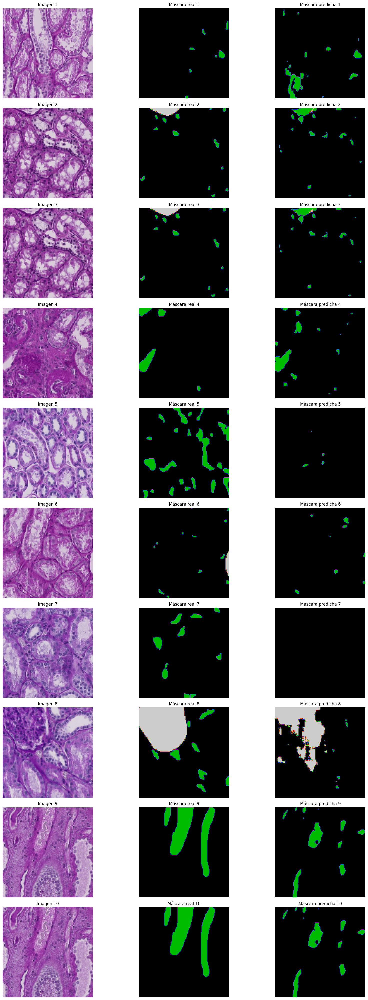

In [ ]:
show_multiple_predictions(num_samples=10)

En la evaluación visual del modelo, se observa que las máscaras predichas logran capturar adecuadamente las regiones de interés marcadas en las máscaras reales, especialmente en áreas bien definidas. El modelo identifica correctamente la forma general de las estructuras relevantes, aunque se presentan algunos falsos positivos en zonas donde no hay segmentación real, lo que indica cierta sensibilidad a patrones similares en el fondo. A pesar de ligeras discrepancias en los bordes, las predicciones muestran una alta coincidencia espacial con las máscaras reales, lo que sugiere un buen desempeño general en la segmentación.

## Unet Attention

El modelo Attention U-Net mostró una mejora cualitativa en la segmentación de estructuras pequeñas o delimitadas, lo cual sugiere que el uso de módulos de atención favoreció la capacidad del modelo para enfocarse en regiones relevantes. La evaluación visual indica una mayor precisión en bordes y menos ruido en predicciones.

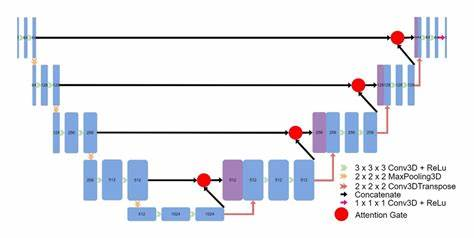

In [25]:
from IPython.display import Image, display

# Ruta a la imagen
display(Image(filename="C:/Users/EMANUEL/Downloads/atte.png"))

Total imágenes cargadas: 200
Pesos de clase: [1.5258789e-13 3.0517578e-13 1.0000000e+00]
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_422 (Conv2D)            (None, 128, 128, 32  896         ['input_25[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_125 (Batch  (None, 128, 128, 32  128        ['conv2d_422[0][0]']             
 No

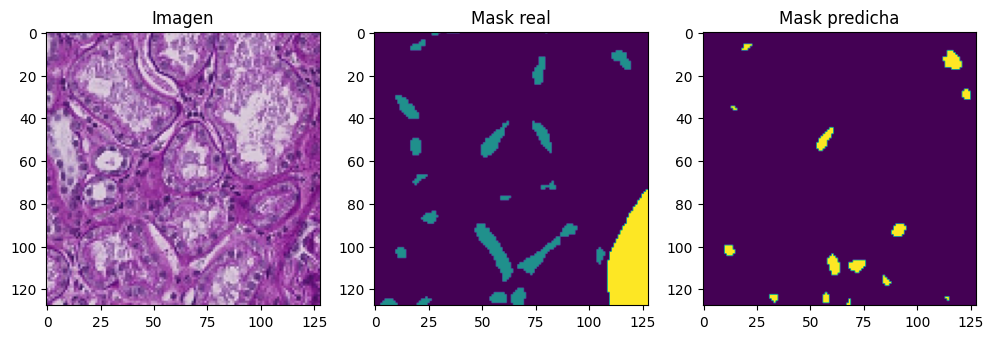

In [36]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers, models
from keras.layers import SpatialDropout2D
from sklearn.model_selection import train_test_split
from keras.metrics import OneHotIoU

# ==== CONFIGURACION ====
IMG_SIZE = (128, 128)
NUM_CLASSES = 3  # fondo + 3 clases
NUM_IMAGES = 200


data_path1 = r"C:/Users/EMANUEL/Documents/"
data_path2 = r"C:/Users/EMANUEL/Documents/"
IMAGE_DIR = os.path.join(data_path1, 'train_filter')
MASK_DIR = os.path.join(data_path2, 'mascaras_guardadas')
  
  # ==== FUNCIONES ====
def fill_mask(mask):
    COLOR_MAPPING = {
        0: (1, 0, 0),
        1: (0, 1, 0),
        2: (0, 0, 1),
        3: (1, 0, 0)
    }
    color_mask = np.zeros(IMG_SIZE + (NUM_CLASSES,), dtype=np.uint8)
    for value, color in COLOR_MAPPING.items():
        color_mask[mask[:,:] == value] = color
    return color_mask

def load_image_mask_pair(name):
    img_path = os.path.join(IMAGE_DIR, f"{name}.tif")
    mask_path = os.path.join(MASK_DIR, f"{name}_mascara.tif")

    if not os.path.exists(img_path) or not os.path.exists(mask_path):
        raise FileNotFoundError(f"No se encontró la imagen o máscara: {name}")

    # Cargar la imagen completa
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, IMG_SIZE)

    # Cargar la máscara completa
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST)

    mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
    mask_class[np.all(mask == [0, 0, 0], axis=-1)] = 0
    mask_class[np.all(mask == [255, 0, 0], axis=-1)] = 1
    mask_class[np.all(mask == [0, 255, 0], axis=-1)] = 2
    mask_class[np.all(mask == [0, 0, 255], axis=-1)] = 3
    mask_class = fill_mask(mask_class)
    return image / 255.0, mask_class

def get_dataset():
    names = sorted([f.split('.')[0] for f in os.listdir(IMAGE_DIR) if f.endswith('.tif')])[:NUM_IMAGES]
    X, y = [], []
    for name in names:
        try:
            img, mask = load_image_mask_pair(name)
            X.append(img)
            y.append(mask)
        except Exception as e:
            print(f"Saltando {name}: {e}")
        if len(X) >= NUM_IMAGES:
            break
    print(f"Total imágenes cargadas: {len(X)}")
    return np.array(X), np.array(y)

def calcular_pesos_de_clase(y_masks, num_classes=4):
    counts = np.zeros(num_classes)
    for mask in y_masks:
        for i in range(num_classes):
            counts[i] += np.sum(mask == i)
    total = np.sum(counts)
    pesos = total / (counts + 1e-6)
    pesos /= np.sum(pesos)
    return pesos.astype(np.float32)

def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)
    def loss(y_true, y_pred):
        y_pred = tf.cast(y_pred, tf.float32)
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        loss = y_true * tf.math.log(y_pred) * weights
        return -tf.reduce_sum(loss, axis=-1)
    return loss

def attention_gate(x, g, inter_channels):
    theta_x = layers.Conv2D(inter_channels, 1, strides=1, padding='same')(x)
    phi_g = layers.Conv2D(inter_channels, 1, strides=1, padding='same')(g)
    add = layers.Add()([theta_x, phi_g])
    act = layers.Activation('relu')(add)
    psi = layers.Conv2D(1, 1, strides=1, padding='same')(act)
    psi = layers.Activation('sigmoid')(psi)
    out = layers.Multiply()([x, psi])
    return out

def build_unet(input_shape, num_classes):
    inputs = layers.Input(input_shape)

    def conv_block(x, filters):
        x = layers.Conv2D(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)

        x = SpatialDropout2D(0.2)(x)

        x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        return x

    def encoder_block(x, filters):
        f = conv_block(x, filters)
        p = layers.MaxPooling2D((2, 2))(f)
        return f, p

    def decoder_block(x, skip, filters):
        up = layers.UpSampling2D((2, 2), interpolation='bilinear')(x)
        att = attention_gate(skip, up, filters // 2)
        concat = layers.Concatenate()([up, att])
        x = conv_block(concat, filters)
        return x
    
    i=32
    f1, p1 = encoder_block(inputs, i)
    f2, p2 = encoder_block(p1, i*2)
    f3, p3 = encoder_block(p2, i*4)
    f4, p4 = encoder_block(p3, i*8)
    f5, p5 = encoder_block(p4, i*16)

    b = conv_block(p5, i*16)
    
    d5 = decoder_block(b, f5, i*16)
    d4 = decoder_block(d5, f4, i*8)
    d3 = decoder_block(d4, f3, i*4)
    d2 = decoder_block(d3, f2, i*2)
    d1 = decoder_block(d2, f1, i)


    outputs = layers.Conv2D(num_classes, 1, activation='softmax')(d1)


    model = models.Model(inputs, outputs)
    return model

# ==== CARGA Y PREPROCESAMIENTO ====
X, y = get_dataset()
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# ==== PESOS BALANCEADOS ====
pesos = calcular_pesos_de_clase(y, num_classes=NUM_CLASSES)
print("Pesos de clase:", pesos)
loss_fn = weighted_categorical_crossentropy(pesos)

# ==== MODELO ====
model = build_unet(input_shape=X.shape[1:], num_classes=NUM_CLASSES)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[OneHotIoU(num_classes=3,target_class_ids=[0,1,2])])
model.summary()

# ==== ENTRENAMIENTO ====
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=120, batch_size=1)

# ==== EVALUACION VISUAL ====
def show_sample_prediction():
    idx = np.random.randint(0, len(X_val))
    sample = X_val[idx:idx+1]
    pred = model.predict(sample)[0]
    pred_mask = np.argmax(pred, axis=-1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(sample[0])
    plt.title("Imagen")
    plt.subplot(1, 3, 2)
    plt.imshow(np.argmax(y_val[idx], axis=-1))
    plt.title("Mask real")
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask)
    plt.title("Mask predicha")
    plt.show()

show_sample_prediction()

### 📊 Resultados del modelo U-Net con atención

- **Pérdida en entrenamiento (`loss`)**: 0.0397  
- **IoU en entrenamiento (`OneHotIoU`)**: 0.8817  
- **Pérdida en validación (`val_loss`)**: 0.8557  
- **IoU en validación (`val_OneHotIoU`)**: 0.4246  

#### 🧠 Interpretación:

El modelo U-Net con atención logra un desempeño alto en el conjunto de entrenamiento (IoU del 88.2%), lo que refleja una buena capacidad para capturar las regiones de interés. No obstante, el IoU en validación desciende a 42.5% y la pérdida aumenta significativamente, lo que indica una mayor tendencia al sobreajuste en comparación con el U-Net estándar. A pesar de esto, el uso de mecanismos de atención puede beneficiar la segmentación de estructuras más pequeñas o sutiles.


1/1 [==============================] - 0s 32ms/step


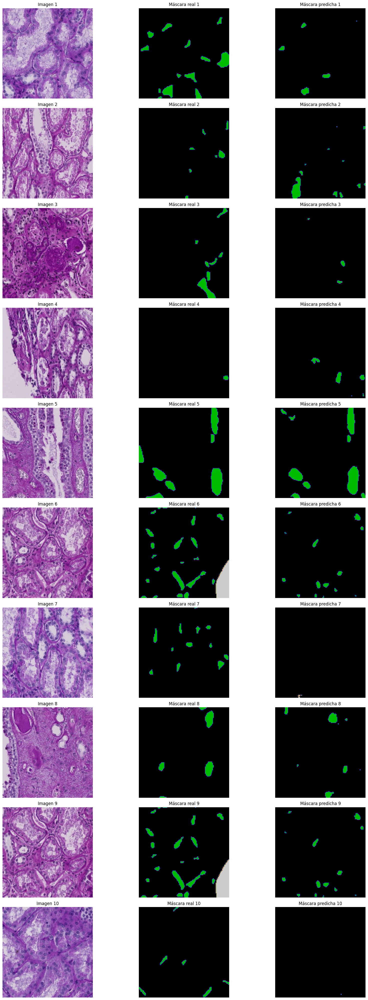

In [37]:
show_multiple_predictions(num_samples=10)

El modelo U-Net con atención logra una segmentación precisa y focalizada, capturando bien las regiones relevantes. Las máscaras predichas coinciden en gran medida con las reales, aunque puede haber pérdida de detalles pequeños en áreas complejas. En general, ofrece un buen desempeño visual gracias al enfoque selectivo de la atención.

## FCN

La arquitectura FCN-8s presentó un rendimiento competitivo, con segmentaciones precisas y bien delineadas. Sin embargo, se observaron casos en los que se produjeron predicciones más difusas en comparación con U-Net con atención, especialmente en áreas pequeñas o de forma irregular.

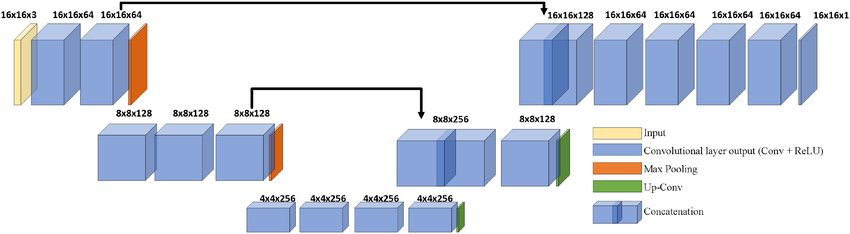

In [26]:
from IPython.display import Image, display

# Ruta a la imagen
display(Image(filename="C:/Users/EMANUEL/Downloads/fcn.png"))

Total imágenes cargadas: 200
Pesos de clase: [1.5258789e-13 3.0517578e-13 1.0000000e+00]
Model: "FCN-8s"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_365 (Conv2D)            (None, 128, 128, 42  1176        ['input_23[0][0]']               
                                )                                                                 
                                                                                                  
 conv2d_366 (Conv2D)            (None, 128, 128, 42  15918       ['conv2d_365[0][0]']             
    

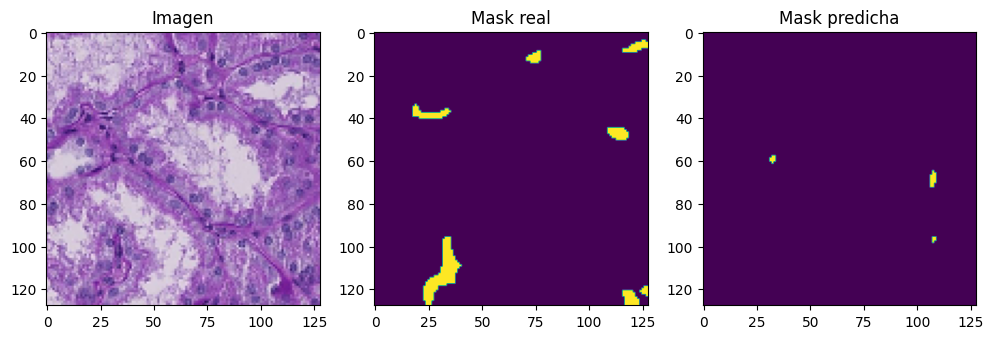

In [33]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers, models
from keras.models import Model
from keras.layers import SpatialDropout2D, Conv2DTranspose, Input, Conv2D, MaxPooling2D, Dropout, concatenate
from sklearn.model_selection import train_test_split
from keras.metrics import OneHotIoU

# ==== CONFIGURACION ====
IMG_SIZE = (128, 128)
NUM_CLASSES = 3  # fondo + 3 clases
NUM_IMAGES = 200


data_path1 = r"C:/Users/EMANUEL/Documents/"
data_path2 = r"C:/Users/EMANUEL/Documents/"
IMAGE_DIR = os.path.join(data_path1, 'train_filter')
MASK_DIR = os.path.join(data_path2, 'mascaras_guardadas')
  
  # ==== FUNCIONES ====
def fill_mask(mask):
    COLOR_MAPPING = {
        0: (1, 0, 0),
        1: (0, 1, 0),
        2: (0, 0, 1),
        3: (1, 0, 0)
    }
    color_mask = np.zeros(IMG_SIZE + (NUM_CLASSES,), dtype=np.uint8)
    for value, color in COLOR_MAPPING.items():
        color_mask[mask[:,:] == value] = color
    return color_mask

def load_image_mask_pair(name):
    img_path = os.path.join(IMAGE_DIR, f"{name}.tif")
    mask_path = os.path.join(MASK_DIR, f"{name}_mascara.tif")

    if not os.path.exists(img_path) or not os.path.exists(mask_path):
        raise FileNotFoundError(f"No se encontró la imagen o máscara: {name}")

    # Cargar la imagen completa
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, IMG_SIZE)

    # Cargar la máscara completa
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST)

    mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
    mask_class[np.all(mask == [0, 0, 0], axis=-1)] = 0
    mask_class[np.all(mask == [255, 0, 0], axis=-1)] = 1
    mask_class[np.all(mask == [0, 255, 0], axis=-1)] = 2
    mask_class[np.all(mask == [0, 0, 255], axis=-1)] = 3
    mask_class = fill_mask(mask_class)
    return image / 255.0, mask_class

def get_dataset():
    names = sorted([f.split('.')[0] for f in os.listdir(IMAGE_DIR) if f.endswith('.tif')])[:NUM_IMAGES]
    X, y = [], []
    for name in names:
        try:
            img, mask = load_image_mask_pair(name)
            X.append(img)
            y.append(mask)
        except Exception as e:
            print(f"Saltando {name}: {e}")
        if len(X) >= NUM_IMAGES:
            break
    print(f"Total imágenes cargadas: {len(X)}")
    return np.array(X), np.array(y)

def calcular_pesos_de_clase(y_masks, num_classes=4):
    counts = np.zeros(num_classes)
    for mask in y_masks:
        for i in range(num_classes):
            counts[i] += np.sum(mask == i)
    total = np.sum(counts)
    pesos = total / (counts + 1e-6)
    pesos /= np.sum(pesos)
    return pesos.astype(np.float32)

def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)
    def loss(y_true, y_pred):
        y_pred = tf.cast(y_pred, tf.float32)
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        loss = y_true * tf.math.log(y_pred) * weights
        return -tf.reduce_sum(loss, axis=-1)
    return loss

def build_fcn(input_shape, num_classes=3):
    """Construcción de Fully Convolutional Network (FCN-8s)."""
    input_layer = Input(shape=input_shape)

    i=42
    # Bloque 1
    x = Conv2D(i, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(input_layer)
    x = Conv2D(i, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    pool1 = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 2
    x = Conv2D(i*2, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(pool1)
    x = Conv2D(i*2, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    pool2 = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 3
    x = Conv2D(i*4, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(pool2)
    x = Conv2D(i*4, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    x = Conv2D(i*4, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    pool3 = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 4
    x = Conv2D(i*8, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(pool3)
    x = Conv2D(i*8, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    x = Conv2D(i*8, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    pool4 = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 5
    x = Conv2D(i*8, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(pool4)
    x = Conv2D(i*8, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    x = Conv2D(i*8, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(x)
    pool5 = MaxPooling2D(pool_size=(2, 2))(x)

    # Fully Convolutional Layers
    fc6 = Conv2D(i*32, (7, 7), activation="relu", padding="same", kernel_initializer='he_normal')(pool5)
    fc6 = Dropout(0.5)(fc6)
    fc7 = Conv2D(i*32, (1, 1), activation="relu", padding="same", kernel_initializer='he_normal')(fc6)
    fc7 = Dropout(0.5)(fc7)

    # Score layers
    score_pool3 = Conv2D(num_classes, (1, 1), padding="same")(pool3)
    score_pool4 = Conv2D(num_classes, (1, 1), padding="same")(pool4)
    score_fc7 = Conv2D(num_classes, (1, 1), padding="same")(fc7)

    # Upsampling y combinación (FCN-8s)
    upscore2 = Conv2DTranspose(num_classes, (4, 4), strides=2, padding="same")(score_fc7)
    fuse_pool4 = concatenate([upscore2, score_pool4])

    upscore4 = Conv2DTranspose(num_classes, (4, 4), strides=2, padding="same")(fuse_pool4)
    fuse_pool3 = concatenate([upscore4, score_pool3])

    upscore8 = Conv2DTranspose(num_classes, (16, 16), strides=8, padding="same")(fuse_pool3)

    # Capa de salida
    output_layer = Conv2D(num_classes, (1, 1), activation="softmax", padding="same")(upscore8)

    model = Model(input_layer, output_layer, name="FCN-8s")
    return model

# ==== CARGA Y PREPROCESAMIENTO ====
X, y = get_dataset()
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# ==== PESOS BALANCEADOS ====
pesos = calcular_pesos_de_clase(y, num_classes=NUM_CLASSES)
print("Pesos de clase:", pesos)
loss_fn = weighted_categorical_crossentropy(pesos)

# ==== MODELO ====
# Crear el modelo
model = build_fcn(input_shape=X.shape[1:])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[OneHotIoU(num_classes=3,target_class_ids=[0,1,2])])
model.summary()

# ==== CONFIGURAR MEMORIA DE GPU ====
# Limitar el crecimiento de la memoria de la GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# ==== ENTRENAMIENTO ====
# Reducir el tamaño del batch para evitar errores de memoria
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=150, batch_size=4)

# ==== EVALUACION VISUAL ====
def show_sample_prediction():
    idx = np.random.randint(0, len(X_val))
    sample = X_val[idx:idx+1]
    pred = model.predict(sample)[0]
    pred_mask = np.argmax(pred, axis=-1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(sample[0])
    plt.title("Imagen")
    plt.subplot(1, 3, 2)
    plt.imshow(np.argmax(y_val[idx], axis=-1))
    plt.title("Mask real")
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask)
    plt.title("Mask predicha")
    plt.show()

show_sample_prediction()

### 📊 Resultados del modelo FCN-8s

- **Pérdida en entrenamiento (`loss`)**: 0.0344  
- **IoU en entrenamiento (`OneHotIoU`)**: 0.8871  
- **Pérdida en validación (`val_loss`)**: 0.3973  
- **IoU en validación (`val_OneHotIoU`)**: 0.5923  

#### 🧠 Interpretación:

El modelo FCN-8s alcanza un IoU del 88.7% en entrenamiento, reflejando una buena capacidad de segmentación. En validación obtiene un IoU de 59.2%, superior al de los otros modelos, lo que sugiere una mejor generalización. La diferencia entre las métricas de entrenamiento y validación es moderada, indicando un equilibrio adecuado entre aprendizaje y generalización.


1/1 [==============================] - 0s 22ms/step


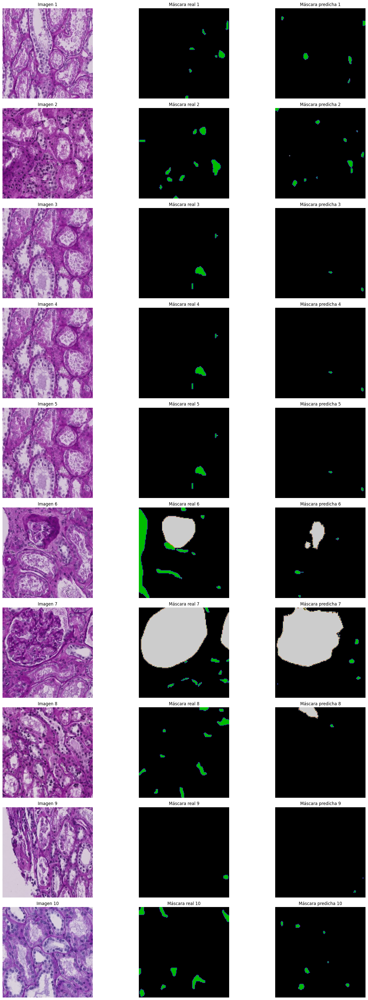

In [34]:
show_multiple_predictions(num_samples=10)

A nivel visual, el modelo FCN-8s muestra una segmentación clara y coherente con las máscaras reales, capturando correctamente la mayoría de las regiones de interés. Las predicciones presentan buena precisión en la forma y ubicación de las estructuras, aunque en algunos casos se omiten pequeñas áreas o aparecen leves falsos positivos. En general, las máscaras generadas por el modelo reflejan un buen equilibrio entre cobertura y precisión, con un desempeño visual consistente.

## DeepLabv3+

DeepLabV3+ es una arquitectura avanzada para segmentación semántica que combina convoluciones dilatadas con el módulo de pirámide de espacios atrous (ASPP), lo que le permite capturar información contextual a múltiples escalas sin perder resolución espacial. Además, incorpora un decodificador que refina los bordes y mejora la segmentación en regiones detalladas.

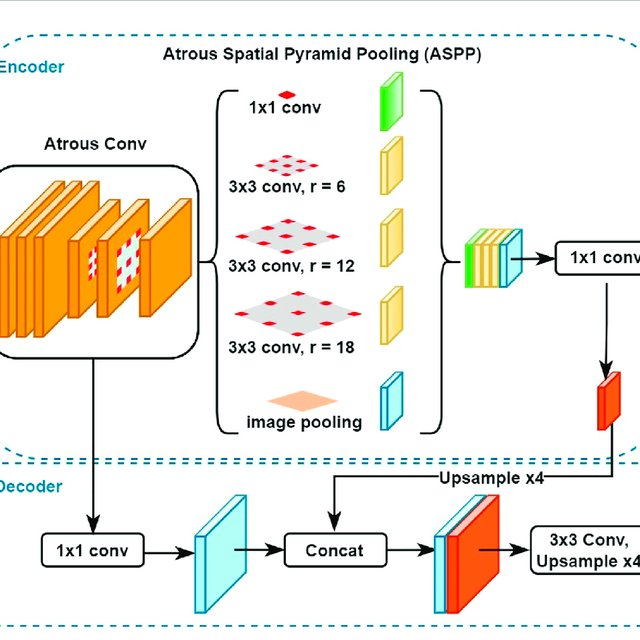

In [27]:
from IPython.display import Image, display

# Ruta a la imagen
display(Image(filename="C:/Users/EMANUEL/Downloads/deep.png"))

In [3]:
# --- BLOQUE ASPP ---
def ASPP(x, filters):
    shape = x.shape
    y1 = layers.Conv2D(filters, 1, padding='same', dilation_rate=1, activation='relu')(x)
    y2 = layers.Conv2D(filters, 3, padding='same', dilation_rate=6, activation='relu')(x)
    y3 = layers.Conv2D(filters, 3, padding='same', dilation_rate=12, activation='relu')(x)
    y4 = layers.Conv2D(filters, 3, padding='same', dilation_rate=18, activation='relu')(x)

    y5 = layers.GlobalAveragePooling2D()(x)
    y5 = layers.Reshape((1, 1, shape[-1]))(y5)
    y5 = layers.Conv2D(filters, 1, padding='same', activation='relu')(y5)
    y5 = layers.UpSampling2D(size=(shape[1], shape[2]), interpolation='bilinear')(y5)

    y = layers.Concatenate()([y1, y2, y3, y4, y5])
    return layers.Conv2D(filters, 1, padding='same', activation='relu')(y)

# --- MODELO DeepLabV3+ MANUAL ---
def build_deeplabv3plus(input_shape=(512, 512, 3), n_classes=3):
    base_model = tf.keras.applications.ResNet50(input_shape=input_shape,
                                                 include_top=False, weights='imagenet')

    x = base_model.get_layer("conv4_block6_2_relu").output
    x = ASPP(x, 256)
    x = layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(x)

    low_level_feat = base_model.get_layer("conv2_block3_2_relu").output
    low_level_feat = layers.Conv2D(48, 1, padding='same', activation='relu')(low_level_feat)

    x = layers.Concatenate()([x, low_level_feat])
    x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)
    x = layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(x)

    outputs = layers.Conv2D(n_classes, 1, activation='softmax')(x)
    return models.Model(inputs=base_model.input, outputs=outputs)



Total imágenes cargadas: 200
Pesos de clase: [1.5258789e-13 3.0517578e-13 1.0000000e+00]
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 134, 134, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 64, 64, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 co

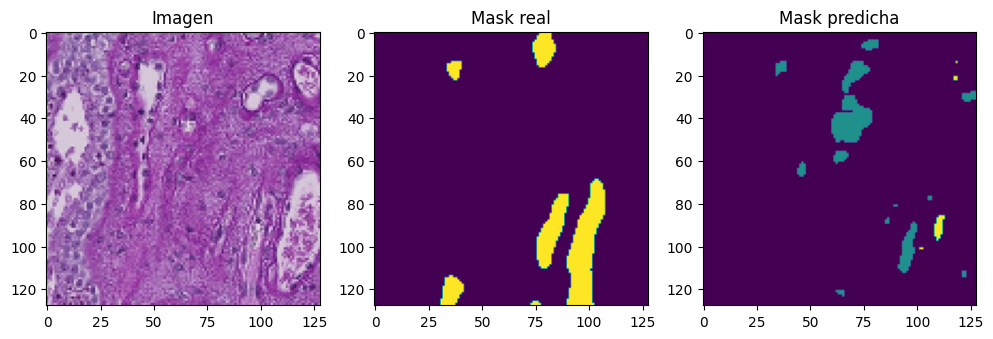

In [6]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers, models
from keras.models import Model
from keras.layers import SpatialDropout2D, Conv2DTranspose, Input, Conv2D, MaxPooling2D, Dropout, concatenate
from sklearn.model_selection import train_test_split
from keras.metrics import OneHotIoU

# ==== CONFIGURACION ====
IMG_SIZE = (128, 128)
NUM_CLASSES = 3  # fondo + 3 clases
NUM_IMAGES = 200


data_path1 = r"C:/Users/EMANUEL/Documents/"
data_path2 = r"C:/Users/EMANUEL/Documents/"
IMAGE_DIR = os.path.join(data_path1, 'train_filter')
MASK_DIR = os.path.join(data_path2, 'mascaras_guardadas')
  
  # ==== FUNCIONES ====
def fill_mask(mask):
    COLOR_MAPPING = {
        0: (1, 0, 0),
        1: (0, 1, 0),
        2: (0, 0, 1),
        3: (1, 0, 0)
    }
    color_mask = np.zeros(IMG_SIZE + (NUM_CLASSES,), dtype=np.uint8)
    for value, color in COLOR_MAPPING.items():
        color_mask[mask[:,:] == value] = color
    return color_mask

def load_image_mask_pair(name):
    img_path = os.path.join(IMAGE_DIR, f"{name}.tif")
    mask_path = os.path.join(MASK_DIR, f"{name}_mascara.tif")

    if not os.path.exists(img_path) or not os.path.exists(mask_path):
        raise FileNotFoundError(f"No se encontró la imagen o máscara: {name}")

    # Cargar la imagen completa
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, IMG_SIZE)

    # Cargar la máscara completa
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST)

    mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
    mask_class[np.all(mask == [0, 0, 0], axis=-1)] = 0
    mask_class[np.all(mask == [255, 0, 0], axis=-1)] = 1
    mask_class[np.all(mask == [0, 255, 0], axis=-1)] = 2
    mask_class[np.all(mask == [0, 0, 255], axis=-1)] = 3
    mask_class = fill_mask(mask_class)
    return image / 255.0, mask_class

def get_dataset():
    names = sorted([f.split('.')[0] for f in os.listdir(IMAGE_DIR) if f.endswith('.tif')])[:NUM_IMAGES]
    X, y = [], []
    for name in names:
        try:
            img, mask = load_image_mask_pair(name)
            X.append(img)
            y.append(mask)
        except Exception as e:
            print(f"Saltando {name}: {e}")
        if len(X) >= NUM_IMAGES:
            break
    print(f"Total imágenes cargadas: {len(X)}")
    return np.array(X), np.array(y)

def calcular_pesos_de_clase(y_masks, num_classes=4):
    counts = np.zeros(num_classes)
    for mask in y_masks:
        for i in range(num_classes):
            counts[i] += np.sum(mask == i)
    total = np.sum(counts)
    pesos = total / (counts + 1e-6)
    pesos /= np.sum(pesos)
    return pesos.astype(np.float32)

def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)
    def loss(y_true, y_pred):
        y_pred = tf.cast(y_pred, tf.float32)
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        loss = y_true * tf.math.log(y_pred) * weights
        return -tf.reduce_sum(loss, axis=-1)
    return loss

# ==== CARGA Y PREPROCESAMIENTO ====
X, y = get_dataset()
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# ==== PESOS BALANCEADOS ====
pesos = calcular_pesos_de_clase(y, num_classes=NUM_CLASSES)
print("Pesos de clase:", pesos)
loss_fn = weighted_categorical_crossentropy(pesos)

# ==== MODELO ====
# Crear el modelo
# Update the input size to match the dataset's image size
model = build_deeplabv3plus(n_classes=3, input_shape=(128, 128, 3))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[OneHotIoU(num_classes=3,target_class_ids=[0,1,2])])
model.summary()

# ==== CONFIGURAR MEMORIA DE GPU ====
# Limitar el crecimiento de la memoria de la GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# ==== ENTRENAMIENTO ====
# Reducir el tamaño del batch para evitar errores de memoria
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=150, batch_size=4)

# ==== EVALUACION VISUAL ====
def show_sample_prediction():
    idx = np.random.randint(0, len(X_val))
    sample = X_val[idx:idx+1]
    pred = model.predict(sample)[0]
    pred_mask = np.argmax(pred, axis=-1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(sample[0])
    plt.title("Imagen")
    plt.subplot(1, 3, 2)
    plt.imshow(np.argmax(y_val[idx], axis=-1))
    plt.title("Mask real")
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask)
    plt.title("Mask predicha")
    plt.show()

show_sample_prediction()

### 📊 Resultados del modelo DeepLabV3+

- **Pérdida en entrenamiento (`loss`)**: 0.0209  
- **IoU en entrenamiento (`OneHotIoU`)**: 0.9298  
- **Pérdida en validación (`val_loss`)**: 0.3339  
- **IoU en validación (`val_OneHotIoU`)**: 0.6493  

#### 🧠 Interpretación:

DeepLabV3+ obtuvo el mejor desempeño entre los modelos evaluados, alcanzando un IoU del **92.9% en entrenamiento** y **64.9% en validación**, lo que indica una alta capacidad de segmentación y excelente generalización. La diferencia entre entrenamiento y validación es relativamente baja, lo que sugiere que el modelo no presenta sobreajuste significativo. Gracias a su arquitectura basada en convoluciones dilatadas y módulos ASPP, logró capturar información de contexto a múltiples escalas y segmentar con precisión tanto estructuras grandes como pequeñas.


1/1 [==============================] - 0s 88ms/step


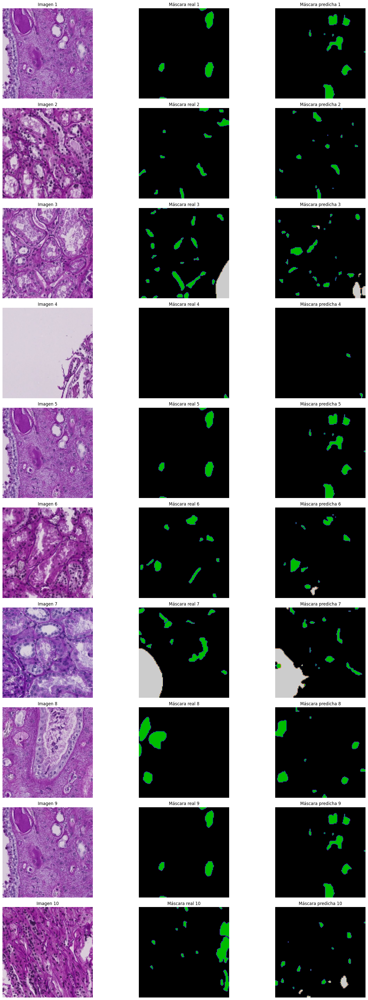

In [10]:
show_multiple_predictions(num_samples=10)

El modelo DeepLabV3+ presenta segmentaciones visualmente precisas y limpias, con una buena correspondencia entre las máscaras reales y las predichas. Se evidencia una detección efectiva de las regiones de interés, incluso en áreas pequeñas y de formas irregulares, lo que refleja la capacidad del modelo para capturar detalles a distintas escalas. Además, la segmentación mantiene bordes bien definidos y con poco ruido, gracias a su arquitectura avanzada que integra contexto global sin perder resolución local. En general, el desempeño visual es sólido y coherente con sus métricas cuantitativas.

# Best Models

## Top 1: DeepLabV3

1/1 [==============================] - 0s 42ms/step


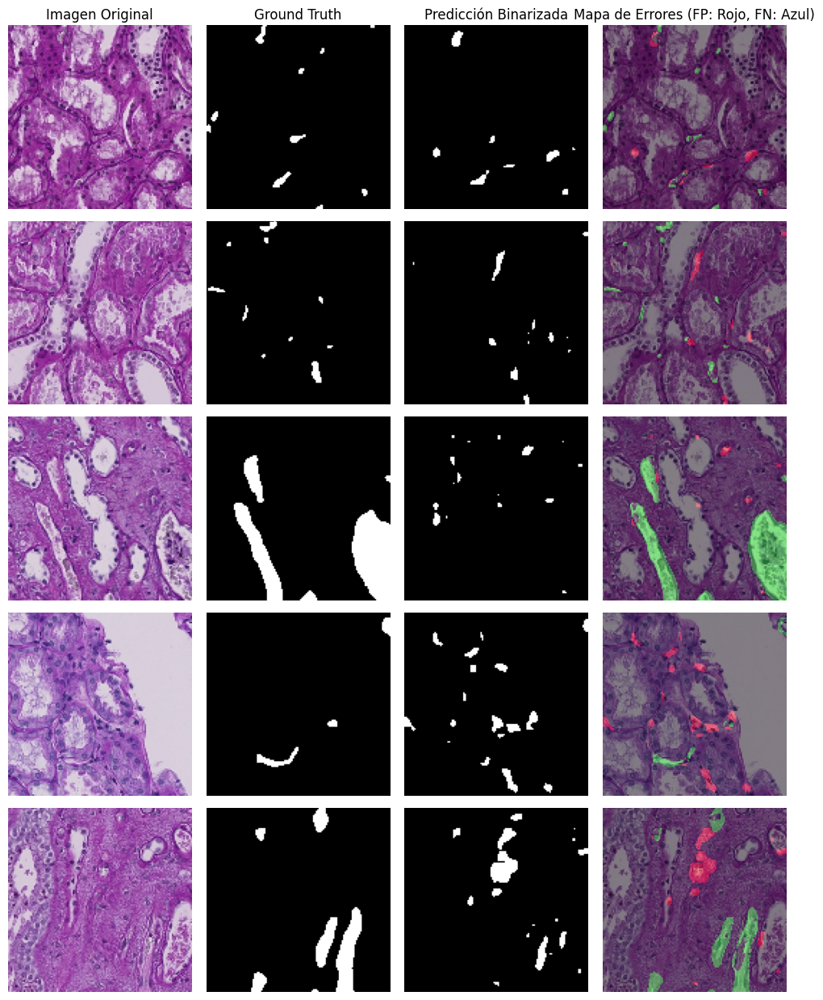

In [13]:
def plot_errores_segmentacion(model, X_val, y_val, num_muestras=5):
    plt.figure(figsize=(10, num_muestras * 2.5))
    for i in range(num_muestras):
        idx = np.random.randint(0, len(X_val))
        image = X_val[idx]
        true_mask = np.argmax(y_val[idx], axis=-1)
        pred_mask = np.argmax(model.predict(image[np.newaxis, ...])[0], axis=-1)

        bin_true = (true_mask > 0).astype(np.uint8)
        bin_pred = (pred_mask > 0).astype(np.uint8)

        fp = np.logical_and(bin_pred == 1, bin_true == 0)  # Falsos positivos
        fn = np.logical_and(bin_pred == 0, bin_true == 1)  # Falsos negativos

        error_map = np.stack([fp * 255, fn * 255, np.zeros_like(fp)], axis=-1).astype(np.uint8)
        overlay_error = cv2.addWeighted((image * 255).astype(np.uint8), 0.6, error_map, 0.4, 0)

        titles = ["Imagen Original", "Ground Truth", "Predicción Binarizada", "Mapa de Errores (FP: Rojo, FN: Azul)"]
        images = [image, bin_true, bin_pred, overlay_error]

        for j, img in enumerate(images):
            plt.subplot(num_muestras, 4, i * 4 + j + 1)
            plt.imshow(img, cmap='gray' if j > 0 else None)
            plt.axis("off")
            if i == 0:
                plt.title(titles[j])
    plt.tight_layout()
    plt.show()
plot_errores_segmentacion(model, X_val, y_val, num_muestras=5)

La visualización muestra ejemplos de segmentación con DeepLabV3+, comparando las imágenes originales, las máscaras reales, las predicciones del modelo y una superposición de errores. En esta última, las regiones en verde indican aciertos (verdaderos positivos), mientras que las rojas representan errores del modelo (falsos positivos), y las áreas omitidas son falsos negativos. Se observa que el modelo logra detectar correctamente estructuras grandes, pero su rendimiento disminuye en regiones pequeñas o de bordes irregulares, donde aparecen errores dispersos. Esto sugiere que, si bien DeepLabV3+ ofrece un buen desempeño general, puede beneficiarse de ajustes para mejorar la precisión en detalles finos y reducir errores de sobresegmentación y omisión.


In [15]:
from sklearn.metrics import jaccard_score, f1_score, precision_score, recall_score, roc_auc_score, balanced_accuracy_score

def calcular_metricas_batch(model, X, y_true):
    metrics = {"IoU": [], "Dice": [], "Precision": [], "Recall": [], "AUC": [], "Balanced Acc": []}
    for i in range(len(X)):
        pred = model.predict(X[i:i+1])[0]
        pred_mask = np.argmax(pred, axis=-1).flatten()
        true_mask = np.argmax(y_true[i], axis=-1).flatten()

        bin_pred = (pred_mask > 0).astype(np.uint8)
        bin_true = (true_mask > 0).astype(np.uint8)

        metrics["IoU"].append(jaccard_score(bin_true, bin_pred))
        metrics["Dice"].append(f1_score(bin_true, bin_pred))
        metrics["Precision"].append(precision_score(bin_true, bin_pred))
        metrics["Recall"].append(recall_score(bin_true, bin_pred))
        metrics["AUC"].append(roc_auc_score(bin_true, pred[:, :, 1].flatten()))
        metrics["Balanced Acc"].append(balanced_accuracy_score(bin_true, bin_pred))
    return metrics

1/1 [==============================] - 0s 40ms/step


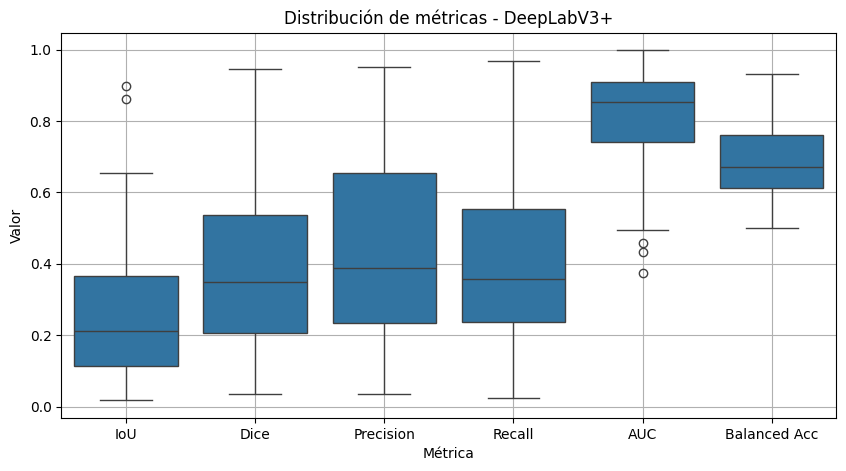

In [18]:
import seaborn as sns
import pandas as pd

def plot_boxplot_metricas(metrics_dict):
    df = pd.DataFrame(metrics_dict)
    df_melted = df.melt(var_name='Métrica', value_name='Valor')

    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df_melted, x="Métrica", y="Valor")
    plt.title("Distribución de métricas - DeepLabV3+")
    plt.grid(True)
    plt.show()
plot_boxplot_metricas(calcular_metricas_batch(model, X_val, y_val))

### 📊 Análisis del Boxplot de Métricas – DeepLabV3+

El gráfico muestra la distribución de seis métricas de evaluación calculadas sobre el conjunto de validación para el modelo **DeepLabV3+**. A continuación, se detallan los puntos clave:

- **AUC** y **Balanced Accuracy** son las métricas con mayor rendimiento y menor dispersión. Esto indica que el modelo tiene una buena capacidad de discriminación global y un adecuado balance entre clases, incluso ante posibles desbalances.

- **IoU (Jaccard)** y **Dice Coefficient**, que miden la superposición entre la predicción y la máscara real, presentan una **dispersión considerable** y **medianas bajas** (~0.2–0.3). Esto sugiere que, aunque el modelo logra identificar correctamente algunas regiones, tiene dificultades para alinear con precisión las máscaras reales en muchos casos.

- **Precision** y **Recall** muestran una **alta variabilidad**, lo que implica que el modelo es inconsistente en la cantidad de verdaderos positivos detectados (**recall**) y en la proporción de predicciones correctas sobre las totales (**precision**).

- **Presencia de outliers:** Se observan valores atípicos en varias métricas, lo cual indica que existen muestras en el conjunto de validación donde el modelo falla considerablemente (por ejemplo, al predecir en exceso o no detectar la región de interés).


1/1 [==============================] - 0s 30ms/step


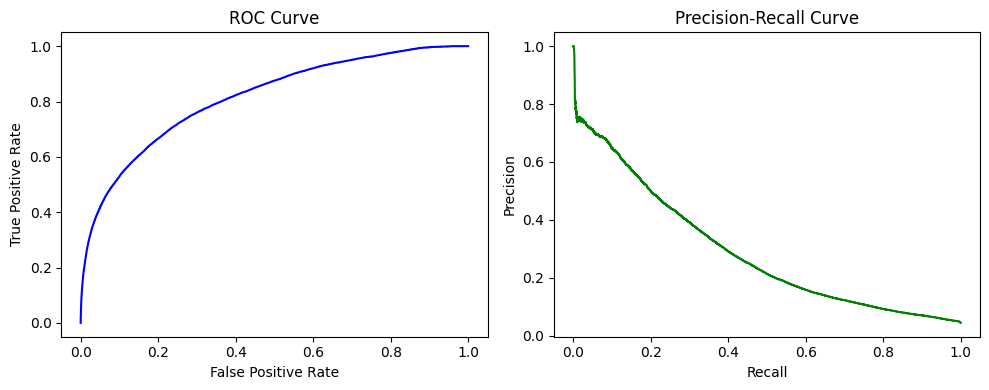

In [19]:
from sklearn.metrics import roc_curve, precision_recall_curve

def plot_curvas_roc_pr(model, X_val, y_val):
    y_true_bin = []
    y_scores = []

    for i in range(len(X_val)):
        pred = model.predict(X_val[i:i+1])[0]
        y_pred_class1 = pred[:, :, 1].flatten()
        y_scores.extend(y_pred_class1)

        mask = np.argmax(y_val[i], axis=-1).flatten()
        y_true_bin.extend((mask == 1).astype(np.uint8))

    fpr, tpr, _ = roc_curve(y_true_bin, y_scores)
    prec, rec, _ = precision_recall_curve(y_true_bin, y_scores)

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='blue')
    plt.title("ROC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")

    plt.subplot(1, 2, 2)
    plt.plot(rec, prec, color='green')
    plt.title("Precision-Recall Curve")
    plt.xlabel("Recall")
    plt.ylabel("Precision")

    plt.tight_layout()
    plt.show()
plot_curvas_roc_pr(model, X_val, y_val)

### 📈 Curvas ROC y Precision-Recall – DeepLabV3+

Las siguientes curvas permiten evaluar la capacidad del modelo DeepLabV3+ para distinguir entre las clases (segmentación binaria).

- **Curva ROC (Receiver Operating Characteristic):**  
  La curva muestra una trayectoria por encima de la diagonal, lo que indica que el modelo tiene una capacidad razonable para diferenciar entre clases positivas y negativas. Sin embargo, la forma curva no se acerca del todo al vértice superior izquierdo, lo que sugiere que el rendimiento, aunque aceptable, **no es óptimo** en cuanto a la relación entre tasa de verdaderos positivos (TPR) y falsos positivos (FPR).

- **Curva Precision-Recall:**  
  Esta curva revela una caída progresiva en la precisión a medida que se incrementa el recall. Aunque comienza con valores altos de precisión (~1.0), esta disminuye rápidamente, lo cual indica que, al intentar capturar más positivos (mayor recall), el modelo **sacrifica exactitud** en las predicciones, generando más falsos positivos. Esto puede deberse a un desequilibrio de clases o dificultad para delimitar regiones pequeñas.

#### 🧠 Conclusión:
El modelo muestra un buen desempeño general, pero con espacio para mejoras en sensibilidad y precisión, especialmente en casos más complejos o estructuras pequeñas. Estas curvas complementan el análisis de métricas y ayudan a visualizar los compromisos entre exactitud y cobertura.
